In [4]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [1]:
import torch 
import torch.nn as nn 
from mlp_ae import MLPAutoEncoder

obs_dim = [11, 1]
ac_dim = [50, 7]
latent_dim = 30
hidden = [180, 90, 60]
obs_t = torch.randn(obs_dim)
traj = torch.randn(ac_dim)
action_ae = MLPAutoEncoder(obs_dim, ac_dim, latent_dim, hidden)
out = action_ae(obs_t, traj)
print(out.shape)

decoder_layers [60, 90, 180]
decoder_layers [30, 60, 90, 180, 361]
torch.Size([180])
torch.Size([180])
torch.Size([180])
torch.Size([90])
torch.Size([90])
torch.Size([90])
torch.Size([60])
torch.Size([60])
torch.Size([60])
torch.Size([30])
torch.Size([30])
torch.Size([30])
torch.Size([361])


In [1]:
from latent_dataset import LatentActionBuffer

action_dataset = LatentActionBuffer("/extra_storage/three_piece_assembly_latent_actions/buf.pkl", 
                                    100, 
                                    ac_chunk=30, 
                                    obs_dim=11,
                                    ac_dim=7)

100%|██████████| 200/200 [00:01<00:00, 158.04it/s]


In [2]:
for i, sample in enumerate(action_dataset):
    print(sample[0], sample[1].shape)

tensor([-0.0979,  0.0355,  0.2120,  0.8847,  0.4176,  0.0418, -0.4042,  0.9971,
         0.1980, -0.1599,  0.2787]) torch.Size([30, 7])
tensor([-0.1156,  0.0356,  0.2095,  0.8965,  0.4167,  0.0605, -0.4041,  0.9971,
         0.1977, -0.1430,  0.2606]) torch.Size([30, 7])
tensor([-0.1468,  0.0362,  0.2045,  0.9119,  0.4161,  0.0866, -0.4050,  0.9973,
         0.1961, -0.0289,  0.1364]) torch.Size([30, 7])
tensor([-0.1810,  0.0381,  0.1907,  0.9250,  0.4168,  0.1105, -0.4077,  0.9977,
         0.1925,  0.1620, -0.0720]) torch.Size([30, 7])
tensor([-0.2165,  0.0417,  0.1672,  0.9362,  0.4189,  0.1328, -0.4120,  0.9983,
         0.1866,  0.3965, -0.3283]) torch.Size([30, 7])
tensor([-0.2531,  0.0468,  0.1361,  0.9459,  0.4219,  0.1537, -0.4176,  0.9990,
         0.1786,  0.6089, -0.5608]) torch.Size([30, 7])
tensor([-0.2910,  0.0571,  0.0989,  0.9551,  0.4114,  0.1757, -0.4117,  0.9992,
         0.1576,  0.7364, -0.6971]) torch.Size([30, 7])
tensor([-0.3299,  0.0635,  0.0596,  0.9635,  0.4

In [4]:
from torch.utils.data import DataLoader
from latent_dataset import LatentActionBuffer, IterableWrapper

import torch.nn as nn 
import torch 
import numpy as np 
action_data_iterable = IterableWrapper(action_dataset)
train_loader = DataLoader(action_dataset, batch_size=4, shuffle=True, num_workers=0)
for i_batch, sample_batched in enumerate(train_loader):
    print(i_batch, sample_batched[0].size(),
          sample_batched[1].size())

0 torch.Size([4, 11]) torch.Size([4, 30, 7])
1 torch.Size([4, 11]) torch.Size([4, 30, 7])
2 torch.Size([4, 11]) torch.Size([4, 30, 7])
3 torch.Size([4, 11]) torch.Size([4, 30, 7])
4 torch.Size([4, 11]) torch.Size([4, 30, 7])
5 torch.Size([4, 11]) torch.Size([4, 30, 7])
6 torch.Size([4, 11]) torch.Size([4, 30, 7])
7 torch.Size([4, 11]) torch.Size([4, 30, 7])
8 torch.Size([4, 11]) torch.Size([4, 30, 7])
9 torch.Size([4, 11]) torch.Size([4, 30, 7])
10 torch.Size([4, 11]) torch.Size([4, 30, 7])
11 torch.Size([4, 11]) torch.Size([4, 30, 7])
12 torch.Size([4, 11]) torch.Size([4, 30, 7])
13 torch.Size([4, 11]) torch.Size([4, 30, 7])
14 torch.Size([4, 11]) torch.Size([4, 30, 7])
15 torch.Size([4, 11]) torch.Size([4, 30, 7])
16 torch.Size([4, 11]) torch.Size([4, 30, 7])
17 torch.Size([4, 11]) torch.Size([4, 30, 7])
18 torch.Size([4, 11]) torch.Size([4, 30, 7])
19 torch.Size([4, 11]) torch.Size([4, 30, 7])
20 torch.Size([4, 11]) torch.Size([4, 30, 7])
21 torch.Size([4, 11]) torch.Size([4, 30, 7]

In [ ]:
import torch 
import torch.nn as nn 
import torch.optim as optim 
from mlp_ae import MLPAutoEncoder
from torch.utils.data import DataLoader
from latent_dataset import LatentActionBuffer, IterableWrapper
batch_size = 16
obs_dim = [11, 1]
ac_dim = [30, 7]
latent_dim = 60
hidden = [180, 90, 60]
obs_t = torch.randn(obs_dim)
traj = torch.randn(ac_dim)
action_ae = MLPAutoEncoder(obs_dim, ac_dim, latent_dim, hidden)
action_ae.cuda()

action_dataset = LatentActionBuffer("/extra_storage/three_piece_assembly_latent_actions/buf.pkl", 
                                    100, 
                                    ac_chunk=30, 
                                    obs_dim=11,
                                    ac_dim=7)

train_loader = DataLoader(action_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

criterion = nn.MSELoss()
optimizer = optim.Adam(action_ae.parameters(), lr=4e-3)
num_epochs = 100

for epoch in range(num_epochs):
    
    # Set the model to training mode.
    # This enables features like Dropout if you're using them.
    action_ae.train()
    
    running_loss = 0.0
    
    # Iterate over your DataLoader
    # We use 'data' as a placeholder for your input batch
    for data_batch in train_loader:
        
        # In a standard autoencoder, we don't need labels.
        # Your dataloader might return (data, label) or just (data).
        
        # If your DataLoader returns (data, label):
        # inputs, _ = data_batch
        # Note: We ignore the label ('_')
        
        # If your DataLoader just returns the data:
        # inputs = data_batch[0] # Assuming data is the first element
        states = data_batch[0]
        actions = data_batch[1].flatten(start_dim=1, end_dim=2)
        # print(f"States dimension: {states.shape}, and actions dimension: {actions.shape}")

        # Move the input data to the device (GPU)
        # inputs = inputs.to("cuda")
        states = states.to("cuda")
        actions = actions.to("cuda")
        # --- The 5 Core Steps of a PyTorch Loop ---
        
        # 1. Zero the gradients
        #    (Clear gradients from the previous pass)
        optimizer.zero_grad()
        
        # 2. Forward pass
        #    (Pass the inputs through the model to get the reconstructed output)
        reconstructed_outputs = action_ae(states, actions)
        
        # 3. Calculate the loss
        #    (Compare the reconstructed output to the ORIGINAL input)
        true_outputs = torch.cat((states, actions), dim=1)
        # print(f"Output Shape:{reconstructed_outputs.shape} and true outputs: {true_outputs.shape} ")
        loss = criterion(reconstructed_outputs, true_outputs)
        
        # 4. Backward pass
        #    (Calculate the gradients of the loss w.r.t. model parameters)
        loss.backward()
        
        # 5. Update the weights
        #    (Adjust the model's weights based on the calculated gradients)
        optimizer.step()
        
        # --- End of Core Steps ---
        
        # Add the batch loss to the total loss for the epoch
        running_loss += loss.item()

    # Calculate and print average loss for the epoch
    epoch_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

print("Training finished.")

In [ ]:
import torch
import torch.nn as nn 

from trainer import AE_Trainer
from mlp_ae import MLPAutoEncoder, MLPVAE, ae_loss, vae_loss
from torch.utils.data import DataLoader
from latent_dataset import LatentActionBuffer, IterableWrapper


batch_size = 16
obs_dim = [11, 1]
ac_dim = [30, 7]
latent_dim = 60
hidden = [180, 90, 60]
obs_t = torch.randn(obs_dim)
traj = torch.randn(ac_dim)
action_ae = MLPVAE(obs_dim, ac_dim, latent_dim, hidden)
action_ae.cuda()

action_dataset = LatentActionBuffer("/extra_storage/three_piece_assembly_latent_actions/buf.pkl", 
                                    100, 
                                    ac_chunk=30, 
                                    obs_dim=11,
                                    ac_dim=7)

train_loader = DataLoader(action_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

optim_params = {"lr": 1e-4, "log_freq": 100, "epochs": 100, }
trainer = AE_Trainer(action_ae, vae_loss,"cuda:0", optim_params)
trainer.train_loop(train_loader)



Encoder: ModuleList(
  (0): Linear(in_features=221, out_features=180, bias=True)
  (1): GELU(approximate='none')
  (2): LayerNorm((180,), eps=1e-05, elementwise_affine=True)
  (3): Linear(in_features=180, out_features=90, bias=True)
  (4): GELU(approximate='none')
  (5): LayerNorm((90,), eps=1e-05, elementwise_affine=True)
  (6): Linear(in_features=90, out_features=60, bias=True)
  (7): GELU(approximate='none')
  (8): LayerNorm((60,), eps=1e-05, elementwise_affine=True)
  (9): Linear(in_features=60, out_features=60, bias=True)
  (10): GELU(approximate='none')
)
Decoder: ModuleList(
  (0): Linear(in_features=71, out_features=60, bias=True)
  (1): GELU(approximate='none')
  (2): LayerNorm((60,), eps=1e-05, elementwise_affine=True)
  (3): Linear(in_features=60, out_features=90, bias=True)
  (4): GELU(approximate='none')
  (5): LayerNorm((90,), eps=1e-05, elementwise_affine=True)
  (6): Linear(in_features=90, out_features=180, bias=True)
  (7): GELU(approximate='none')
  (8): LayerNorm((18

100%|██████████| 200/200 [00:01<00:00, 151.69it/s]


Logged loss: 0.006126700639724731
Logged loss: 0.46314800292253494
Logged loss: 0.29167770594358444
Logged loss: 0.20285250917077063
Logged loss: 0.17530693709850312
Logged loss: 0.1584998945891857
Logged loss: 0.15132803969085218
Logged loss: 0.14831878140568733
Logged loss: 0.14263543292880057
Logged loss: 0.13841122798621655
Logged loss: 0.14069287814199924
Logged loss: 0.13592380486428737
Logged loss: 0.12874222226440907
Logged loss: 0.12791630491614342
Logged loss: 0.12730717979371547
Logged loss: 0.1251011586934328
Logged loss: 0.12843135304749012
Logged loss: 0.12459248766303062
Logged loss: 0.12251946590840816
Logged loss: 0.12327169343829154
Logged loss: 0.12190924175083637
Logged loss: 0.11949578858911991
Logged loss: 0.11699665650725365
Logged loss: 0.1164428299665451
Logged loss: 0.11576638013124466
Logged loss: 0.11509342841804028
Logged loss: 0.11684881277382374
Logged loss: 0.11622528962790966
Logged loss: 0.11588626332581044
Logged loss: 0.11147403873503209
Logged loss:

In [ ]:
import torch 
import torch.nn as nn 
import torch.optim as optim 
from mlp_ae import MLPAutoEncoder
from torch.utils.data import DataLoader
from latent_dataset import LatentActionBuffer, IterableWrapper
batch_size = 16
obs_dim = [11, 1]
ac_dim = [30, 7]
latent_dim = 60
hidden = [180, 90, 60]
obs_t = torch.randn(obs_dim)
traj = torch.randn(ac_dim)
action_ae = MLPAutoEncoder(obs_dim, ac_dim, latent_dim, hidden)
action_ae.cuda()

action_dataset = LatentActionBuffer("/extra_storage/three_piece_assembly_latent_actions/buf.pkl", 
                                    100, 
                                    ac_chunk=30, 
                                    obs_dim=11,
                                    ac_dim=7)

train_loader = DataLoader(action_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

# criterion = nn.MSELoss()
def vae_loss(xhat, x, mu, std):
    reconstruction_loss = nn.BCELoss(xhat, x)
    kl_div = 
optimizer = optim.Adam(action_ae.parameters(), lr=4e-3)
num_epochs = 100

for epoch in range(num_epochs):
    
    # Set the model to training mode.
    # This enables features like Dropout if you're using them.
    action_ae.train()
    
    running_loss = 0.0
    
    # Iterate over your DataLoader
    # We use 'data' as a placeholder for your input batch
    for data_batch in train_loader:
        
        # In a standard autoencoder, we don't need labels.
        # Your dataloader might return (data, label) or just (data).
        
        # If your DataLoader returns (data, label):
        # inputs, _ = data_batch
        # Note: We ignore the label ('_')
        
        # If your DataLoader just returns the data:
        # inputs = data_batch[0] # Assuming data is the first element
        states = data_batch[0]
        actions = data_batch[1].flatten(start_dim=1, end_dim=2)
        # print(f"States dimension: {states.shape}, and actions dimension: {actions.shape}")

        # Move the input data to the device (GPU)
        # inputs = inputs.to("cuda")
        states = states.to("cuda")
        actions = actions.to("cuda")
        # --- The 5 Core Steps of a PyTorch Loop ---
        
        # 1. Zero the gradients
        #    (Clear gradients from the previous pass)
        optimizer.zero_grad()
        
        # 2. Forward pass
        #    (Pass the inputs through the model to get the reconstructed output)
        reconstructed_outputs = action_ae(states, actions)
        
        # 3. Calculate the loss
        #    (Compare the reconstructed output to the ORIGINAL input)
        true_outputs = torch.cat((states, actions), dim=1)
        # print(f"Output Shape:{reconstructed_outputs.shape} and true outputs: {true_outputs.shape} ")
        loss = criterion(reconstructed_outputs, true_outputs)
        
        # 4. Backward pass
        #    (Calculate the gradients of the loss w.r.t. model parameters)
        loss.backward()
        
        # 5. Update the weights
        #    (Adjust the model's weights based on the calculated gradients)
        optimizer.step()
        
        # --- End of Core Steps ---
        
        # Add the batch loss to the total loss for the epoch
        running_loss += loss.item()

    # Calculate and print average loss for the epoch
    epoch_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.4f}")

print("Training finished.")

In [4]:
import pickle as pkl 
import cv2 
import matplotlib.pyplot as plt 

with open("/extra_storage/three_piece_assembly/buf.pkl", "rb") as f: 
    buf = pkl.load(f)
    

({'enc_cam_0': array([255, 216, 255, ...,  31, 255, 217], dtype=uint8), 'enc_cam_1': array([255, 216, 255, ...,  63, 255, 217], dtype=uint8), 'enc_cam_2': array([255, 216, 255, ..., 127, 255, 217], dtype=uint8), 'state': array([-0.16674981, -0.01463028, -0.03591238,  0.96651905, -0.20511267,
        0.47016502, -0.46327105, -0.20296592,  0.99757499, -0.15989376,
        0.27868933])}, array([ 0.32209587,  0.12680011, -0.31011435,  0.97178004,  0.01636911,
        0.08563351, -0.06576763, -0.16168038,  0.99751416, -1.        ]), 0.0)
(10,)


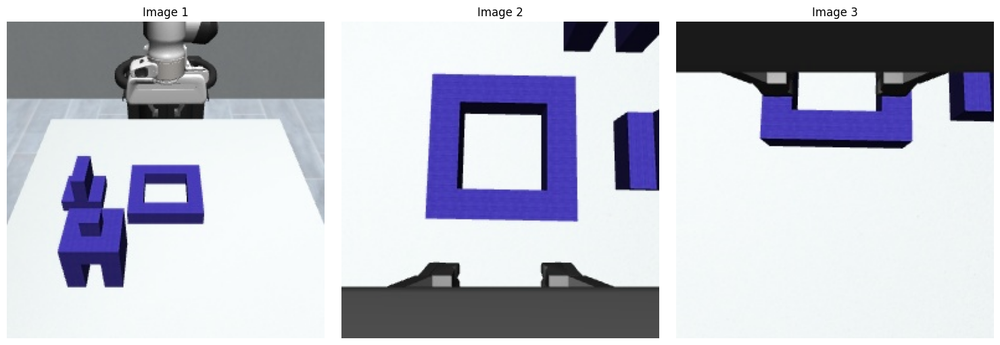

In [5]:
print(buf[0][0])
print(buf[0][0][1].shape)
img1 = cv2.imdecode(buf[0][0][0]['enc_cam_0'],cv2.IMREAD_COLOR)
img2 = cv2.imdecode(buf[0][0][0]['enc_cam_1'],cv2.IMREAD_COLOR)
img3 = cv2.imdecode(buf[0][0][0]['enc_cam_2'],cv2.IMREAD_COLOR)
fig, ax = plt.subplots(1, 3, figsize=(15, 5)) # figsize is optional (width, height in inches)

# 2. Display each image in its corresponding subplot
ax[0].imshow(img1)
ax[0].set_title('Image 1') # Add a title to the first subplot
ax[0].axis('off')         # Hide the axes ticks

ax[1].imshow(img2)
ax[1].set_title('Image 2') # Add a title to the second subplot
ax[1].axis('off')         # Hide the axes ticks

ax[2].imshow(img3)
ax[2].set_title('Image 3') # Add a title to the third subplot
ax[2].axis('off')         # Hide the axes ticks

# 3. Adjust layout to prevent titles from overlapping
plt.tight_layout()

# 4. Show the plot
plt.show()